## joda_01_kehitysympäristö
Jupyter Notebook (ver. 5.7.8) ympäristö Anaconda (ver. 1.9.7) jakeluna omalle PC:lle asennettuna. <br>
Asennus onnistuu https://www.anaconda.com/distribution/ sivuilta valitsemalla oikea käyttöjärjestelmä ja haluttu Python versio.<br>

Editorina Microsoft Visual Studio Code (ver. 1.40.1) PC:lle asennettuna. <br>
Asennus onnistuu https://code.visualstudio.com/download sivuilta valitsemalla oikea käyttöjärjestelmä. <br>

GitHub toimii julkaisualustana sivulla https://github.com/mvehmane/airbnb_munich <br>
GitHub tili on tullut joskus aikaisemmin aktivoitua vaikka en sitä olekaan varsinaisesti käyttänyt. <br>
GitHub on käytettävissä sekä web että desktop ympäristössä. <br>
Asennan myös desktop version harjoittelua varten. <br>
Desktop asennus https://desktop.github.com/ <br>

Näillä työkaluilla yritetään pärjätä ja tarvittaessa asennetaan lisää harjoituksen tekemiseksi.


asennetaan kirjastot yhdessä solussa: <br>
pandas - dataframes <br>
numpy - math <br>
sklearn - machine learning <br>
matplotlib - numerical plotting <br>
collections _ <br>
scipy - numerical plotting<br>
seaborn - data visualization <br>
plotly - data analytics and visualization <br>
dash - analytical web applications <br>
folium - map visualization








In [77]:
#kirjastojen asennus
%matplotlib inline
!pip install folium
import pandas as pd
import numpy as np
import sklearn
from sklearn import ensemble
from sklearn import linear_model
from sklearn.model_selection import learning_curve,GridSearchCV
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
import sklearn.metrics as metrics
import matplotlib
import matplotlib.pyplot as plt
from collections import Counter
import scipy
import seaborn as sns
import plotly.graph_objects as go
import folium
from folium.plugins import HeatMap
from folium.plugins import MarkerCluster


#### Ympäristö oli jo valmiina, joten tämä vaihe oli periaatteessa helppo.

#### Alussa olisi varmaan kannattanut päivittää Anaconda kaikkien kirjastojen osalta.

#### Ongelma koneoppimisen kohdalla scikit learn päivityksen kanssa, päivitys omassa ympäristössä ei onnistunut ja sen vuoksi tein pienen pätkän CSC ympäristössä.

## joda_02_datan_kerääminen
Käytetään insideairbnb sivuston dataa kohdekaupunkina Munich, käytettävissä on kolme datapakettia. <br>
Inside Airbnb sivusto ei kerro tarkemmin datan ominaisuuksista, joten on itse arvioitava eri tietojen hyödyllisyyttä ja käyttökelpoisuutta. <br>
Haetaan kaikki kolme datapakettia: <br>
1. Detailed Listings data for Munich <br>
2. Detailed Calendar Data for listings in Munich <br>
3. Detailed Review Data for listings in Munich <br>




In [78]:
listings_file = 'http://data.insideairbnb.com/germany/bv/munich/2019-09-24/data/listings.csv.gz'

# read listings file into a dataframe
df_listings = pd.read_csv(listings_file, compression='gzip')
df_listings.to_csv('listings.csv')
# tutkitaan datasettiä sarakenimien avulla
pd.options.display.max_rows=110
pd.Series(df_listings.columns)

C:\ProgramData\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3049: DtypeWarning:

Columns (43,61,62,94) have mixed types. Specify dtype option on import or set low_memory=False.



0                                                id
1                                       listing_url
2                                         scrape_id
3                                      last_scraped
4                                              name
5                                           summary
6                                             space
7                                       description
8                               experiences_offered
9                             neighborhood_overview
10                                            notes
11                                          transit
12                                           access
13                                      interaction
14                                      house_rules
15                                    thumbnail_url
16                                       medium_url
17                                      picture_url
18                                   xl_picture_url
19          

In [79]:
# read calendar file into a dataframe
calendar_file = 'http://data.insideairbnb.com/germany/bv/munich/2019-09-24/data/calendar.csv.gz'
df_calendar = pd.read_csv(calendar_file, compression='gzip')
df_calendar.to_csv('calendar.csv')
# sarakkeiden listaus
df_calendar.columns

Index(['listing_id', 'date', 'available', 'price', 'adjusted_price',
       'minimum_nights', 'maximum_nights'],
      dtype='object')

In [80]:
# read reviews file into a dataframe
reviews_file = 'http://data.insideairbnb.com/germany/bv/munich/2019-09-24/data/reviews.csv.gz'
df_reviews = pd.read_csv(reviews_file, compression='gzip')
df_reviews.to_csv('reviews.csv')
# sarakkeiden listaus
df_reviews.columns

Index(['listing_id', 'id', 'date', 'reviewer_id', 'reviewer_name', 'comments'], dtype='object')

In [81]:
df_reviews.head()

,listing_id,id,date,reviewer_id,reviewer_name,comments
0,36720,12723661,2014-05-09,11840468,Mikhail,I would like to thank Gabriella as her apartme...
1,36720,13147830,2014-05-20,5466213,Kim,Gabriela's place was absolutely fantastic. It...
2,36720,16302574,2014-07-25,2062882,Juan R.,"Quiet place, open to a courtyard, with all the..."
3,36720,16428874,2014-07-27,1225618,David,The best Airbnb expeierence I've had. The apar...
4,36720,19478358,2014-09-13,13977301,Cal,"All first rate ! Beautiful apartment, comforta..."


In [82]:
# yhdistetään df_listings ja df.reviews datasetit kohteen id:llä ja luodaan listings_reviews.csv

df_listings_reviews = df_listings.merge(df_reviews, left_on='id', right_on='listing_id')
df_listings_reviews.to_csv('listings_reviews.csv')

In [83]:
df_listings_reviews.head(3)


,id_x,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,listing_id,id_y,date,reviewer_id,reviewer_name,comments
0,36720,https://www.airbnb.com/rooms/36720,20190924033931,2019-09-24,"Beautiful 2 rooms flat, Glockenbach","Very quiet, yet centrally located 2 rooms apt....","2-Zimmer Altbauwohung Beste Lage, zentral, im ...","Very quiet, yet centrally located 2 rooms apt....",none,Glockenbachviertel area has the hippest restau...,...,1,0,0,0.38,36720,12723661,2014-05-09,11840468,Mikhail,I would like to thank Gabriella as her apartme...
1,36720,https://www.airbnb.com/rooms/36720,20190924033931,2019-09-24,"Beautiful 2 rooms flat, Glockenbach","Very quiet, yet centrally located 2 rooms apt....","2-Zimmer Altbauwohung Beste Lage, zentral, im ...","Very quiet, yet centrally located 2 rooms apt....",none,Glockenbachviertel area has the hippest restau...,...,1,0,0,0.38,36720,13147830,2014-05-20,5466213,Kim,Gabriela's place was absolutely fantastic. It...
2,36720,https://www.airbnb.com/rooms/36720,20190924033931,2019-09-24,"Beautiful 2 rooms flat, Glockenbach","Very quiet, yet centrally located 2 rooms apt....","2-Zimmer Altbauwohung Beste Lage, zentral, im ...","Very quiet, yet centrally located 2 rooms apt....",none,Glockenbachviertel area has the hippest restau...,...,1,0,0,0.38,36720,16302574,2014-07-25,2062882,Juan R.,"Quiet place, open to a courtyard, with all the..."


#### Datan haku onnistui hyvin helposti.

#### Kahden setin yhdistäminen onnistui.

#### Datan alustava hahmottelu helppoa jos tietää oikeat komennot.

## joda_03_datan_jalostaminen
Hahmotellaan datasettien sisältöä:<br>
-koko<br>
-tietotyyppi<br>
-NaN (not a number) arvojen etsiminen<br>
Korjataan dataa tarvittaessa

Datasettien hahmottelua df.shape metodilla<br>
(rivimäärä, sarakemäärä)


In [84]:
df_reviews.shape


(170005, 6)

In [85]:
print(df_listings.shape)

(12357, 106)


In [86]:
print(df_calendar.shape)

(4510305, 7)


In [87]:
df_listings_reviews.shape

(170005, 112)

Datasettien hahmottelua df.info metodilla

In [88]:
df_listings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12357 entries, 0 to 12356
Columns: 106 entries, id to reviews_per_month
dtypes: float64(24), int64(21), object(61)
memory usage: 10.0+ MB


In [89]:
df_calendar.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4510305 entries, 0 to 4510304
Data columns (total 7 columns):
listing_id        int64
date              object
available         object
price             object
adjusted_price    object
minimum_nights    int64
maximum_nights    int64
dtypes: int64(3), object(4)
memory usage: 240.9+ MB


In [90]:
df_reviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170005 entries, 0 to 170004
Data columns (total 6 columns):
listing_id       170005 non-null int64
id               170005 non-null int64
date             170005 non-null object
reviewer_id      170005 non-null int64
reviewer_name    170005 non-null object
comments         169940 non-null object
dtypes: int64(3), object(3)
memory usage: 7.8+ MB


In [91]:
df_listings_reviews.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 170005 entries, 0 to 170004
Columns: 112 entries, id_x to comments
dtypes: float64(24), int64(24), object(64)
memory usage: 146.6+ MB


Alustavasti näyttää siltä, että dataa on riittävästi.<br>
Tässä vaiheessa myös päätän käyttää em. dataseteistä kahta:<br>
df_listings<br>
df_listings_reviews<br>

Molemmissa seteissä on yli 100 saraketta dataa ja koska Inside Airbnb sivulta en onnistunut löytämään datalle kuvauksia päätän seurata https://mapr.com/blog/predicting-airbnb-listing-prices-scikit-learn-and-apache-spark/ sivun esimerkkiä pienin muutoksin df_listings datasetin alustavaan muokkaamiseen.


In [92]:
cols1 = ['price',
        'accommodates',
        'bedrooms',
        'beds',
        'neighbourhood_cleansed',
        'room_type',
        'reviews_per_month',
        'number_of_reviews',
        'review_scores_rating',
        'latitude',
        'longitude'
        ]

df_listings_cleansed = pd.read_csv('listings.csv', usecols=cols1)
#tarkistetaan tulos
df_listings_cleansed.head()

,neighbourhood_cleansed,latitude,longitude,room_type,accommodates,bedrooms,beds,price,number_of_reviews,review_scores_rating,reviews_per_month
0,Ludwigsvorstadt-Isarvorstadt,48.13057,11.56929,Entire home/apt,2,1.0,1.0,$95.00,25,98.0,0.38
1,Hadern,48.11476,11.48782,Entire home/apt,2,1.0,1.0,$80.00,128,97.0,1.32
2,Berg am Laim,48.11923,11.63726,Entire home/apt,5,1.0,3.0,$95.00,48,95.0,0.48
3,Maxvorstadt,48.15198,11.56486,Entire home/apt,4,1.0,1.0,$120.00,82,97.0,0.81
4,Pasing-Obermenzing,48.13898,11.46612,Entire home/apt,3,1.0,1.0,$55.00,30,93.0,0.30


Muokataan price tiedot numeeriseen muotoon, poistetaan $ merkki

In [93]:

df_listings_cleansed['price'] = df_listings_cleansed['price'].replace('[\$,)]','',  \
        regex=True).replace('[(]','-', regex=True).astype(float)

In [94]:
df_listings_cleansed.head()

,neighbourhood_cleansed,latitude,longitude,room_type,accommodates,bedrooms,beds,price,number_of_reviews,review_scores_rating,reviews_per_month
0,Ludwigsvorstadt-Isarvorstadt,48.13057,11.56929,Entire home/apt,2,1.0,1.0,95.0,25,98.0,0.38
1,Hadern,48.11476,11.48782,Entire home/apt,2,1.0,1.0,80.0,128,97.0,1.32
2,Berg am Laim,48.11923,11.63726,Entire home/apt,5,1.0,3.0,95.0,48,95.0,0.48
3,Maxvorstadt,48.15198,11.56486,Entire home/apt,4,1.0,1.0,120.0,82,97.0,0.81
4,Pasing-Obermenzing,48.13898,11.46612,Entire home/apt,3,1.0,1.0,55.0,30,93.0,0.30


In [95]:
df_listings_cleansed.dtypes

neighbourhood_cleansed     object
latitude                  float64
longitude                 float64
room_type                  object
accommodates                int64
bedrooms                  float64
beds                      float64
price                     float64
number_of_reviews           int64
review_scores_rating      float64
reviews_per_month         float64
dtype: object

price muunnos onnistui<br>
jatketaan datan tutkimista ja muokkaamista

In [96]:
#tutkitaan kuinka paljon löytyy tyhjiä soluja eri sarakkeissa
df_listings_cleansed.isnull().sum()

neighbourhood_cleansed       0
latitude                     0
longitude                    0
room_type                    0
accommodates                 0
bedrooms                    31
beds                        12
price                        0
number_of_reviews            0
review_scores_rating      4024
reviews_per_month         3784
dtype: int64

Ei mitään kovin vakavaa, poistetaan rivit joissa bedrooms tai bed on nolla ja korvataan review_scores_rating ja reviews_per_month null arvot arvolla 0.

In [97]:
#nollarivien poisto
df_listings_cleansed_zeros_removed =df_listings_cleansed.dropna(subset = ['bedrooms', 'beds'])
#Null arvojen korvaaminen 
df_listings_cleansed_zeros_removed_NaN_replaced = df_listings_cleansed_zeros_removed.fillna(0)

In [98]:
df_listings_cleansed_zeros_removed_NaN_replaced.describe()

,latitude,longitude,accommodates,bedrooms,beds,price,number_of_reviews,review_scores_rating,reviews_per_month
count,12315.000000,12315.000000,12315.000000,12315.000000,12315.000000,12315.000000,12315.000000,12315.000000,12315.000000
mean,48.140001,11.564667,2.711571,1.091758,1.551929,119.205441,13.796346,64.097929,0.649449
std,0.025130,0.043892,1.515163,0.707182,1.237362,126.958472,37.342559,44.912452,1.354135
min,48.063700,11.378370,1.000000,0.000000,0.000000,8.000000,0.000000,0.000000,0.000000
25%,48.123285,11.540785,2.000000,1.000000,1.000000,55.000000,0.000000,0.000000,0.000000
50%,48.137410,11.565700,2.000000,1.000000,1.000000,89.000000,2.000000,93.000000,0.180000
75%,48.156120,11.584835,3.000000,1.000000,2.000000,140.000000,10.000000,100.000000,0.770000
max,48.231090,11.712280,16.000000,25.000000,50.000000,5000.000000,680.000000,100.000000,73.580000


price vaihtelu $8 ja $5000 välillä, hintaennustimen kohdalla ääriarvoja on ehkä syytä poistaa.<br>
Palataan siihen myöhemmin.

In [99]:
df_listings_cleansed_zeros_removed_NaN_replaced.isnull().sum()

neighbourhood_cleansed    0
latitude                  0
longitude                 0
room_type                 0
accommodates              0
bedrooms                  0
beds                      0
price                     0
number_of_reviews         0
review_scores_rating      0
reviews_per_month         0
dtype: int64

In [100]:
#data vaikuttaa olevan ok siivousoperaation jäljiltä.

In [101]:
df_listings_cleansed_zeros_removed_NaN_replaced.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12315 entries, 0 to 12356
Data columns (total 11 columns):
neighbourhood_cleansed    12315 non-null object
latitude                  12315 non-null float64
longitude                 12315 non-null float64
room_type                 12315 non-null object
accommodates              12315 non-null int64
bedrooms                  12315 non-null float64
beds                      12315 non-null float64
price                     12315 non-null float64
number_of_reviews         12315 non-null int64
review_scores_rating      12315 non-null float64
reviews_per_month         12315 non-null float64
dtypes: float64(7), int64(2), object(2)
memory usage: 1.1+ MB


Muokataan df_listings_reviews datasetin sarakkeet

In [102]:
cols2 = ['reviewer_id',
        'reviewer_name',
        'date',
        'comments',
        'listing_id',
        'neighbourhood_cleansed',
        'room_type',
        'reviews_per_month',
        'number_of_reviews',
        'review_scores_rating'
        ]

df_listings_reviews_cleansed = pd.read_csv('listings_reviews.csv', usecols=cols2)
#tarkistetaan tulos
df_listings_reviews_cleansed.head()

,neighbourhood_cleansed,room_type,number_of_reviews,review_scores_rating,reviews_per_month,listing_id,date,reviewer_id,reviewer_name,comments
0,Ludwigsvorstadt-Isarvorstadt,Entire home/apt,25,98.0,0.38,36720,2014-05-09,11840468,Mikhail,I would like to thank Gabriella as her apartme...
1,Ludwigsvorstadt-Isarvorstadt,Entire home/apt,25,98.0,0.38,36720,2014-05-20,5466213,Kim,Gabriela's place was absolutely fantastic. It...
2,Ludwigsvorstadt-Isarvorstadt,Entire home/apt,25,98.0,0.38,36720,2014-07-25,2062882,Juan R.,"Quiet place, open to a courtyard, with all the..."
3,Ludwigsvorstadt-Isarvorstadt,Entire home/apt,25,98.0,0.38,36720,2014-07-27,1225618,David,The best Airbnb expeierence I've had. The apar...
4,Ludwigsvorstadt-Isarvorstadt,Entire home/apt,25,98.0,0.38,36720,2014-09-13,13977301,Cal,"All first rate ! Beautiful apartment, comforta..."


In [103]:
df_listings_reviews_cleansed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170005 entries, 0 to 170004
Data columns (total 10 columns):
neighbourhood_cleansed    170005 non-null object
room_type                 170005 non-null object
number_of_reviews         170005 non-null int64
review_scores_rating      169696 non-null float64
reviews_per_month         170005 non-null float64
listing_id                170005 non-null int64
date                      170005 non-null object
reviewer_id               170005 non-null int64
reviewer_name             170005 non-null object
comments                  169940 non-null object
dtypes: float64(2), int64(3), object(5)
memory usage: 13.0+ MB


In [104]:
df_listings_reviews_cleansed.isnull().sum()

neighbourhood_cleansed      0
room_type                   0
number_of_reviews           0
review_scores_rating      309
reviews_per_month           0
listing_id                  0
date                        0
reviewer_id                 0
reviewer_name               0
comments                   65
dtype: int64

In [105]:
# Null arvot eivät haittaa joten annetaan olla alkuperäisessä muodossa.

#### Perustoiminnot helppoja kunhan vain tietää oikean toiminnon.

#### Analyysin lopputuloksen kannalta on vaikea päätellä milloin datan voi vain poistaa havainnoista ja milloin sitä pitäisi muokata.

#### Imputointimenetelmien käytännön harjoittelu jäi tekemättä.

## joda_04_datan_kuvaileminen



In [106]:
#kohteiden jakauma eri alueilla
df_listings_cleansed_zeros_removed_NaN_replaced.neighbourhood_cleansed.value_counts()

Ludwigsvorstadt-Isarvorstadt                              1333
Maxvorstadt                                               1156
Schwabing-West                                             892
Neuhausen-Nymphenburg                                      851
Au-Haidhausen                                              836
Schwabing-Freimann                                         666
Bogenhausen                                                564
Milbertshofen-Am Hart                                      547
Sendling                                                   528
Schwanthalerhöhe                                           481
Ramersdorf-Perlach                                         454
Sendling-Westpark                                          437
Thalkirchen-Obersendling-Forstenried-Fürstenried-Solln     434
Laim                                                       428
Obergiesing                                                417
Altstadt-Lehel                                         

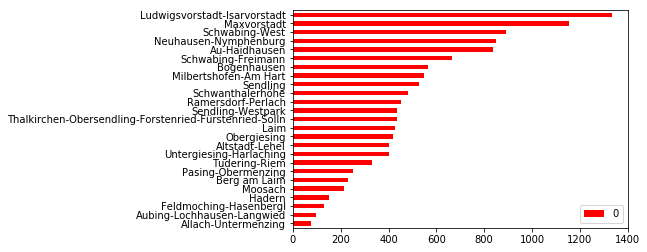

In [107]:
#kohteiden jakauma pylväsdiagrammina
nb_counts = Counter(df_listings_cleansed_zeros_removed_NaN_replaced.neighbourhood_cleansed)
tdf = pd.DataFrame.from_dict(nb_counts, orient='index').sort_values(by=0)
tdf.plot(kind='barh', color='r')

In [108]:
#makuuhuoneiden lukumäärän jakauma
df_listings_cleansed_zeros_removed_NaN_replaced.bedrooms.value_counts()

1.0     9207
2.0     1386
0.0     1294
3.0      334
4.0       72
5.0        8
8.0        6
7.0        3
6.0        2
25.0       1
20.0       1
10.0       1
Name: bedrooms, dtype: int64

In [109]:
#makuuhuoneiden lukumäärien jakauma ja prosenttiosuus(hover), piirakkakuvio, Plotly
labels = df_listings_cleansed_zeros_removed_NaN_replaced['bedrooms'].unique()

values = df_listings_cleansed_zeros_removed_NaN_replaced.bedrooms.value_counts()


fig = go.Figure(data=[go.Pie(labels=labels, values=values)])
fig.update_traces(hoverinfo='label+percent', textinfo='value', textfont_size=12,
                  marker=dict(line=dict(color='#000000', width=2)))
fig.show()

In [110]:
#sänkyjen lukumäärän jakauma
df_listings_cleansed.beds.value_counts()


1.0     7819
2.0     3009
3.0      701
4.0      322
0.0      212
5.0      114
6.0       80
7.0       33
8.0       30
16.0       9
10.0       5
12.0       3
9.0        2
18.0       2
20.0       1
50.0       1
11.0       1
30.0       1
Name: beds, dtype: int64

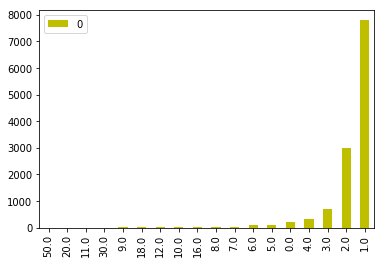

In [111]:
#sänkyjen jakauma pylväsdiagrammina
b_counts = Counter(df_listings_cleansed_zeros_removed_NaN_replaced.beds)
bdf = pd.DataFrame.from_dict(b_counts, orient='index').sort_values(by=0)
bdf.plot(kind='bar', color='y')

In [112]:
#huoneistotyyppien jakauma
df_listings_cleansed.room_type.value_counts()

Entire home/apt    6927
Private room       5127
Shared room         200
Hotel room          103
Name: room_type, dtype: int64

In [113]:
#huoneistotyyppien jakauma ja prosenttiosuus(hover), donitsikuvio, Plotly
labels = df_listings_cleansed_zeros_removed_NaN_replaced['room_type'].unique()

values = df_listings_cleansed_zeros_removed_NaN_replaced.room_type.value_counts()


fig = go.Figure(data=[go.Pie(labels=labels, values=values, hole=.3)])
fig.update_traces(hoverinfo='label+percent', textinfo='value', textfont_size=12,
                  marker=dict(line=dict(color='#000000', width=2)))
fig.show()

In [114]:
#tarkastellaan alueita ja hintoja
#viisi kalleinta
df_listings_cleansed_zeros_removed_NaN_replaced.sort_values(by='price', ascending=False).head(5)

,neighbourhood_cleansed,latitude,longitude,room_type,accommodates,bedrooms,beds,price,number_of_reviews,review_scores_rating,reviews_per_month
7533,Ludwigsvorstadt-Isarvorstadt,48.12473,11.56480,Entire home/apt,4,2.0,2.0,5000.0,4,100.0,0.33
1749,Au-Haidhausen,48.13341,11.59741,Private room,2,1.0,1.0,3000.0,0,0.0,0.00
4907,Maxvorstadt,48.14847,11.55244,Entire home/apt,14,4.0,6.0,2250.0,4,90.0,0.16
8577,Altstadt-Lehel,48.15338,11.58853,Entire home/apt,12,6.0,7.0,2000.0,1,0.0,0.63
7180,Ludwigsvorstadt-Isarvorstadt,48.12463,11.56442,Private room,4,1.0,1.0,2000.0,1,100.0,0.08


In [115]:
#viisi halvinta
df_listings_cleansed_zeros_removed_NaN_replaced.sort_values(by='price', ascending=False).tail(5)

,neighbourhood_cleansed,latitude,longitude,room_type,accommodates,bedrooms,beds,price,number_of_reviews,review_scores_rating,reviews_per_month
6338,Au-Haidhausen,48.12744,11.60278,Shared room,1,1.0,1.0,10.0,0,0.0,0.00
3660,Aubing-Lochhausen-Langwied,48.14218,11.43758,Private room,2,1.0,1.0,9.0,0,0.0,0.00
10401,Obergiesing,48.11844,11.57923,Private room,2,1.0,1.0,9.0,0,0.0,0.00
9701,Bogenhausen,48.14413,11.61754,Entire home/apt,4,0.0,2.0,9.0,9,100.0,2.48
5270,Maxvorstadt,48.15016,11.57729,Private room,2,1.0,1.0,8.0,16,88.0,0.64


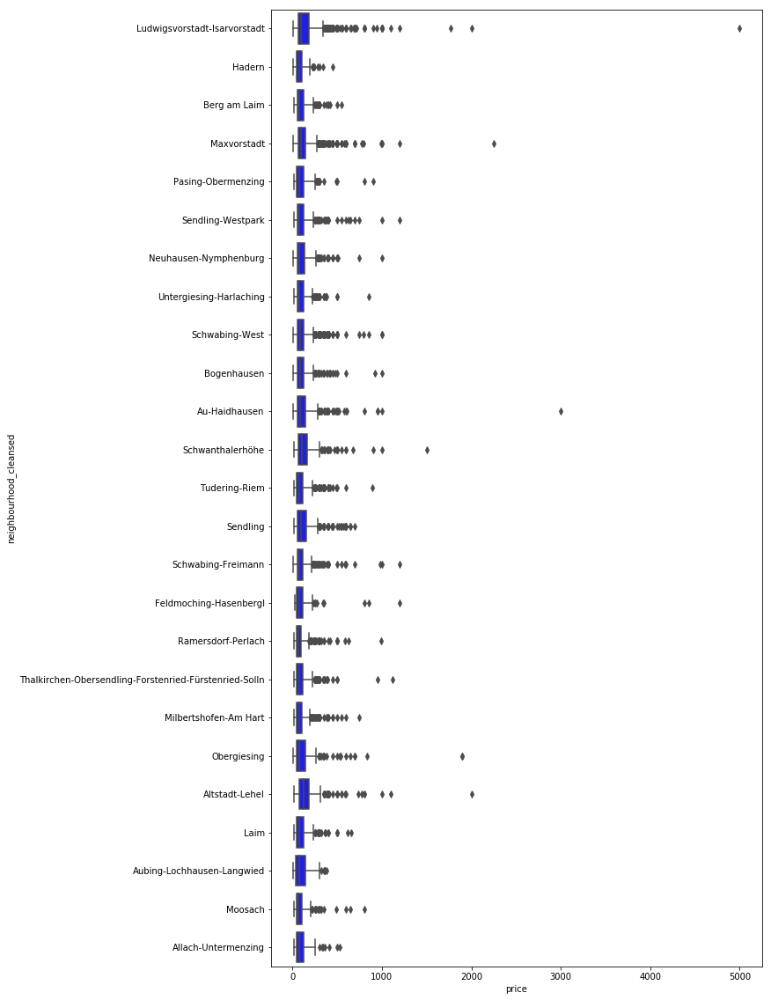

In [116]:
#hintavertailu boxplot kuvaajalla, Seaborn
plt.figure(figsize=(10,20))
ax = sns.boxplot(y='neighbourhood_cleansed', x='price', color='blue', data=df_listings_cleansed_zeros_removed_NaN_replaced)

In [117]:
#Useilla alueilla on yksittäisiä poikkeavan kalliita kohteita

In [118]:
#https://www.shanelynn.ie/summarising-aggregation-and-grouping-data-in-python-pandas/ esimerkkiä seuraten
df_aggregated_prices = df_listings_cleansed_zeros_removed_NaN_replaced.groupby(
     ['neighbourhood_cleansed']
  ).agg(
    Count=('neighbourhood_cleansed', len),
    Max_price=('price', max),
    Min_price=('price', min),
    Median=('price', np.median),
    Mean=('price', np.mean),
  )
df_aggregated_prices.head(30)

,Count,Max_price,Min_price,Median,Mean
neighbourhood_cleansed,,,,,
Allach-Untermenzing,75,530.0,18.0,75.0,111.373333
Altstadt-Lehel,404,2000.0,13.0,125.0,161.712871
Au-Haidhausen,836,3000.0,10.0,90.0,127.296651
Aubing-Lochhausen-Langwied,97,380.0,9.0,76.0,106.000000
Berg am Laim,229,550.0,20.0,80.0,105.262009
Bogenhausen,564,1000.0,9.0,84.5,106.875887
Feldmoching-Hasenbergl,130,1200.0,25.0,79.0,111.707692
Hadern,152,450.0,10.0,75.0,89.125000
Laim,428,660.0,12.0,80.0,99.922897


## Tässä kohtaa tuli väännettyä aika kauan koska en tajunnut, että pandas versio oli sen verran vanha ettei se tukenut GroupBy.agg() eli Named Aggregation metodia edellä kuvatulla tavalla (New in version 0.25.0)

In [119]:
#visualisoidaan edellä luotua datasettiä (df_aggregated_prices)

<Figure size 432x288 with 0 Axes>

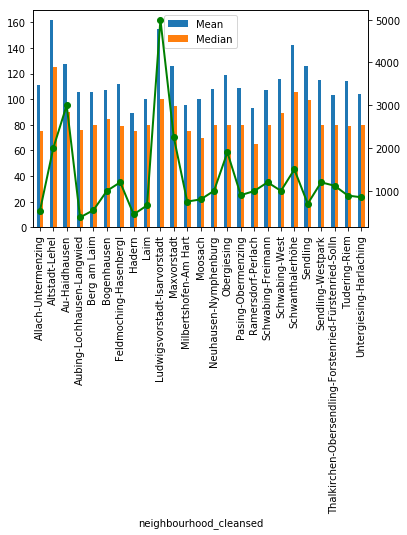

In [120]:
fig = plt.figure()
ax = df_aggregated_prices[['Mean','Median']].plot(kind='bar', use_index=True)
ax2 = ax.twinx()
ax2.plot(df_aggregated_prices[['Max_price']].values, linestyle='-', marker='o', color='g', linewidth=2.0)

In [121]:
#Keskiaarvot ja mediaanit välillä $65 ja $161, maksimi(vihreä viiva, asteikko oikealla) välillä $380 ja $5000

<Figure size 432x288 with 0 Axes>

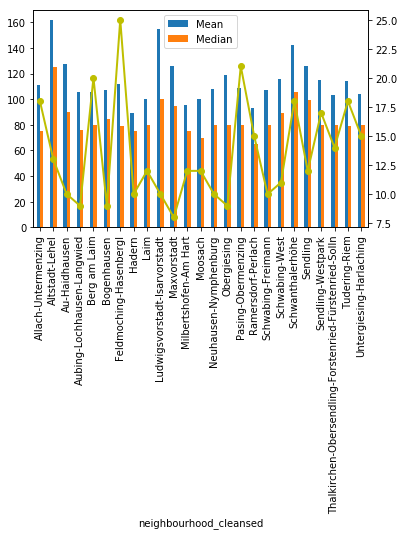

In [122]:
fig = plt.figure()
ax = df_aggregated_prices[['Mean','Median']].plot(kind='bar', use_index=True)
ax2 = ax.twinx()
ax2.plot(df_aggregated_prices[['Min_price']].values, linestyle='-', marker='o', color='y', linewidth=2.0)

In [123]:
#Melko harhaanjohtava kuva, minimi (keltainen viiva, asteikko oikealla) välillä $8 ja $25

In [124]:
#Kartta visualisointia, ensin piti asentaa !pip install folium komennolla kirjasto ja sitten import folium
folium_map = folium.Map(location=[48.1497, 11.585], zoom_start=12)
folium.TileLayer("OpenStreetMap").add_to(folium_map)
folium_map

In [125]:
#Koordinaatit listoina listaan
heat_data = [[row['latitude'], row['longitude']] for index, row in df_listings_cleansed_zeros_removed_NaN_replaced.iterrows()]
HeatMap(heat_data).add_to(folium_map)
folium_map

In [126]:
folium_map = folium.Map(location=[48.1497, 11.585], zoom_start=12)
#Kohdeklusterointi
marker_cluster_group = MarkerCluster(name="Airbnb").add_to(folium_map)
#Kohteiden lisäys klusteriin
for row in df_listings_cleansed_zeros_removed_NaN_replaced.iterrows():
    #popup-tiedot
    html=("kissa")
          
    popup = folium.Popup(html, max_width=200, min_width=200)
    folium.Marker(location = [48.1497, 11.585],
                  popup=popup).add_to(marker_cluster_group)
marker_cluster_group.add_to(folium_map)
folium_map


Ei onnistunut useiden yritysten jälkeen

In [127]:
#Korrelaatiomatriisi
corr = df_listings_cleansed_zeros_removed_NaN_replaced.corr()

In [128]:
corr

,latitude,longitude,accommodates,bedrooms,beds,price,number_of_reviews,review_scores_rating,reviews_per_month
latitude,1.000000,-0.072662,-0.020550,-0.024595,-0.022714,-0.020907,-0.012105,-0.007932,-0.003475
longitude,-0.072662,1.000000,-0.030866,-0.014442,-0.023635,0.006058,0.036832,0.031311,0.044144
accommodates,-0.020550,-0.030866,1.000000,0.582741,0.709096,0.392337,0.036087,0.016776,0.029729
bedrooms,-0.024595,-0.014442,0.582741,1.000000,0.652080,0.262036,0.022387,0.031041,-0.005520
beds,-0.022714,-0.023635,0.709096,0.652080,1.000000,0.253500,0.046355,0.020009,0.036330
price,-0.020907,0.006058,0.392337,0.262036,0.253500,1.000000,-0.102399,-0.150934,-0.100014
number_of_reviews,-0.012105,0.036832,0.036087,0.022387,0.046355,-0.102399,1.000000,0.252646,0.600378
review_scores_rating,-0.007932,0.031311,0.016776,0.031041,0.020009,-0.150934,0.252646,1.000000,0.316786
reviews_per_month,-0.003475,0.044144,0.029729,-0.005520,0.036330,-0.100014,0.600378,0.316786,1.000000


In [129]:
#Kovin paljon tästä ei irtoa, hinta aina kiinnostaa ja siihen korreloi vahvimmin majoittujien määrä

In [130]:
#Yhdistetyn dataframen tarkastelua lyhyesti
df_listings_reviews_cleansed

,neighbourhood_cleansed,room_type,number_of_reviews,review_scores_rating,reviews_per_month,listing_id,date,reviewer_id,reviewer_name,comments
0,Ludwigsvorstadt-Isarvorstadt,Entire home/apt,25,98.0,0.38,36720,2014-05-09,11840468,Mikhail,I would like to thank Gabriella as her apartme...
1,Ludwigsvorstadt-Isarvorstadt,Entire home/apt,25,98.0,0.38,36720,2014-05-20,5466213,Kim,Gabriela's place was absolutely fantastic. It...
2,Ludwigsvorstadt-Isarvorstadt,Entire home/apt,25,98.0,0.38,36720,2014-07-25,2062882,Juan R.,"Quiet place, open to a courtyard, with all the..."
3,Ludwigsvorstadt-Isarvorstadt,Entire home/apt,25,98.0,0.38,36720,2014-07-27,1225618,David,The best Airbnb expeierence I've had. The apar...
4,Ludwigsvorstadt-Isarvorstadt,Entire home/apt,25,98.0,0.38,36720,2014-09-13,13977301,Cal,"All first rate ! Beautiful apartment, comforta..."
...,...,...,...,...,...,...,...,...,...,...
170000,Laim,Private room,2,100.0,2.00,38737218,2019-09-23,182823901,Kevin,Wonderful stay and close to everything. Host ...
170001,Thalkirchen-Obersendling-Forstenried-Fürstenri...,Entire home/apt,1,100.0,1.00,38740070,2019-09-22,139316403,Alan,Decent place for a decent price
170002,Milbertshofen-Am Hart,Entire home/apt,1,NaN,1.00,38754368,2019-09-22,296568752,Jo,The host canceled this reservation 11 days bef...
170003,Hadern,Entire home/apt,1,NaN,1.00,38756691,2019-09-21,26737546,Danila,The host canceled this reservation 11 days bef...


In [131]:
df_top10_comments=df_listings_reviews_cleansed.reviewer_id.value_counts()

In [132]:
#TOP10 kommentoijat
df_top10=df_top10_comments.head(10)
df_top10

31569565     45
74133074     44
7818554      36
8060998      33
83255248     29
11037854     26
141558672    23
1636641      21
1193516      20
87554888     19
Name: reviewer_id, dtype: int64

In [133]:
#tutkitaan vielä ykköskommentoijaa

In [134]:
df_top1=df_listings_reviews_cleansed.loc[df_listings_reviews_cleansed['reviewer_id'] == 31569565]
df_top1

,neighbourhood_cleansed,room_type,number_of_reviews,review_scores_rating,reviews_per_month,listing_id,date,reviewer_id,reviewer_name,comments
14347,Au-Haidhausen,Private room,63,91.0,0.71,473201,2018-05-30,31569565,Kaloyan,Schöne Wohnung und die Lage ist top!
27758,Au-Haidhausen,Private room,73,98.0,1.00,1518980,2018-05-25,31569565,Kaloyan,"Die Wohnung ist unglaublich schön, die Lage is..."
46428,Au-Haidhausen,Private room,222,99.0,3.65,3868173,2018-04-06,31569565,Kaloyan,Die Wohnung ist mega groß und modern. Die Gast...
73527,Ramersdorf-Perlach,Private room,43,100.0,0.88,8235326,2019-08-02,31569565,Kaloyan,"Das Zimmer ist sehr gemütlich, die Lage ist se..."
73528,Ramersdorf-Perlach,Private room,43,100.0,0.88,8235326,2019-08-07,31569565,Kaloyan,Es war sehr angenehm und cool! Karin ist sehr ...
73529,Ramersdorf-Perlach,Private room,43,100.0,0.88,8235326,2019-08-13,31569565,Kaloyan,"Alles war top, wie immer. Ich bin sehr zufried..."
73530,Ramersdorf-Perlach,Private room,43,100.0,0.88,8235326,2019-08-23,31569565,Kaloyan,Wie immer bin ich sehr zufrieden und dankbar f...
73531,Ramersdorf-Perlach,Private room,43,100.0,0.88,8235326,2019-08-28,31569565,Kaloyan,Ich musste seit April 2018 aufgrund von einem ...
74457,Ramersdorf-Perlach,Private room,85,100.0,1.75,8283153,2018-09-28,31569565,Kaloyan,"Ich bin schon langfristig bei Karin, wie immer..."
74458,Ramersdorf-Perlach,Private room,85,100.0,1.75,8283153,2018-10-05,31569565,Kaloyan,Wirklich eine 5-Star Erfahrung. Ich bin schon ...


In [135]:
#Ykköskommentoijan kohteiden jakauma
df_top1.listing_id.value_counts()

8283153     33
8235326      5
21647351     1
473201       1
15320495     1
23594089     1
3868173      1
21024454     1
1518980      1
Name: listing_id, dtype: int64

In [136]:
df_top1.loc[df_listings_reviews_cleansed['listing_id'] == 8283153]

,neighbourhood_cleansed,room_type,number_of_reviews,review_scores_rating,reviews_per_month,listing_id,date,reviewer_id,reviewer_name,comments
74457,Ramersdorf-Perlach,Private room,85,100.0,1.75,8283153,2018-09-28,31569565,Kaloyan,"Ich bin schon langfristig bei Karin, wie immer..."
74458,Ramersdorf-Perlach,Private room,85,100.0,1.75,8283153,2018-10-05,31569565,Kaloyan,Wirklich eine 5-Star Erfahrung. Ich bin schon ...
74459,Ramersdorf-Perlach,Private room,85,100.0,1.75,8283153,2018-10-11,31569565,Kaloyan,"Karin ist sehr nett, sehr hilfreich und rücksi..."
74460,Ramersdorf-Perlach,Private room,85,100.0,1.75,8283153,2018-10-26,31569565,Kaloyan,"Die Wohnung ist wirklich schön, Karin war wie ..."
74461,Ramersdorf-Perlach,Private room,85,100.0,1.75,8283153,2018-11-09,31569565,Kaloyan,Wie immer hatte ich einen sehr angenehmen Aufe...
74462,Ramersdorf-Perlach,Private room,85,100.0,1.75,8283153,2018-11-16,31569565,Kaloyan,Ich habe wie immer eine sehr angenehme Zeit be...
74463,Ramersdorf-Perlach,Private room,85,100.0,1.75,8283153,2018-11-23,31569565,Kaloyan,Ich hatte einen sehr angenehmen Aufenthalt bei...
74464,Ramersdorf-Perlach,Private room,85,100.0,1.75,8283153,2018-11-30,31569565,Kaloyan,Wie immer habe ich eine sehr gute Zeit bei Kar...
74465,Ramersdorf-Perlach,Private room,85,100.0,1.75,8283153,2018-12-07,31569565,Kaloyan,"Ein sehr gemütliches Haus, Karin ist sehr nett..."
74466,Ramersdorf-Perlach,Private room,85,100.0,1.75,8283153,2018-12-14,31569565,Kaloyan,Das Haus ist sehr schön und der Standort ist s...


In [137]:
#Kaloyan on tyytyväinen kohteeseen, antanut 33 kertaa scoreksi 100
df_listings_reviews_cleansed.loc[df_listings_reviews_cleansed['listing_id'] == 8283153]

,neighbourhood_cleansed,room_type,number_of_reviews,review_scores_rating,reviews_per_month,listing_id,date,reviewer_id,reviewer_name,comments
74405,Ramersdorf-Perlach,Private room,85,100.0,1.75,8283153,2015-09-25,44242455,Adam,I stayed with Karin for almost a week during O...
74406,Ramersdorf-Perlach,Private room,85,100.0,1.75,8283153,2015-10-01,25866264,Motoaki,ﾎｽﾄの方が何でも質問に答えて下さいました｡\r\n部屋は広く居心地良かったです｡\r\nU...
74407,Ramersdorf-Perlach,Private room,85,100.0,1.75,8283153,2015-12-19,32781350,Daniel,"Karin is an excellent hostess, she cared about..."
74408,Ramersdorf-Perlach,Private room,85,100.0,1.75,8283153,2016-01-29,8060998,Stefanie,Es war super gemütlich bei Karin. Sie hat dafü...
74409,Ramersdorf-Perlach,Private room,85,100.0,1.75,8283153,2016-02-05,8060998,Stefanie,"Wie auch schon das letzte Mal, hab ich mich ei..."
74410,Ramersdorf-Perlach,Private room,85,100.0,1.75,8283153,2016-02-19,8060998,Stefanie,Wie immer war alles tipp-topp!
74411,Ramersdorf-Perlach,Private room,85,100.0,1.75,8283153,2016-03-05,8060998,Stefanie,Es ist immer ein Vergnügen bei Karin zu wohnen :)
74412,Ramersdorf-Perlach,Private room,85,100.0,1.75,8283153,2016-03-12,8060998,Stefanie,Wie immer alles bestens!
74413,Ramersdorf-Perlach,Private room,85,100.0,1.75,8283153,2016-04-08,8060998,Stefanie,"wie immer: freundlich, zuvorkommend und gut au..."
74414,Ramersdorf-Perlach,Private room,85,100.0,1.75,8283153,2016-04-28,8060998,Stefanie,Wie immer war alles tipptopp bei Karin!


In [138]:
#Kaikki muutkin arvostelut samaan kohteeseen score=100, täytyy olla hyvä paikka!!!

#### Esimerkeissä olleiden kuvaajien teko helppoa.

#### Uusien kuvaajien tekemisessä välillä vaikeuksia hahmottaa miten muuttujat asetetaan.

#### Perusosaamisen puute vaikeuttaa esim. silmukointia ja harmittaa, että kartta ei onnistunut ja syy jäi epäselväksi. 

## joda_05_koneoppiminen

In [139]:
#Noudatellaan https://mapr.com/blog/predicting-airbnb-listing-prices-scikit-learn-and-apache-spark/ esimerkin mallia.
#Luotetaan, että edellä tehdyt datan muokkaukset ovat riittäviä harjoituksen tekemisen kannalta.
#Tarkastellaan vain yhden makuuhuoneen huoneistoja.
df_model=df_listings_cleansed_zeros_removed_NaN_replaced
df_model1=df_model[df_model.bedrooms==1]
df_model1


,neighbourhood_cleansed,latitude,longitude,room_type,accommodates,bedrooms,beds,price,number_of_reviews,review_scores_rating,reviews_per_month
0,Ludwigsvorstadt-Isarvorstadt,48.13057,11.56929,Entire home/apt,2,1.0,1.0,95.0,25,98.0,0.38
1,Hadern,48.11476,11.48782,Entire home/apt,2,1.0,1.0,80.0,128,97.0,1.32
2,Berg am Laim,48.11923,11.63726,Entire home/apt,5,1.0,3.0,95.0,48,95.0,0.48
3,Maxvorstadt,48.15198,11.56486,Entire home/apt,4,1.0,1.0,120.0,82,97.0,0.81
4,Pasing-Obermenzing,48.13898,11.46612,Entire home/apt,3,1.0,1.0,55.0,30,93.0,0.30
...,...,...,...,...,...,...,...,...,...,...,...
12351,Ludwigsvorstadt-Isarvorstadt,48.12611,11.55930,Private room,2,1.0,1.0,85.0,0,0.0,0.00
12352,Schwabing-Freimann,48.18165,11.61060,Private room,1,1.0,1.0,70.0,0,0.0,0.00
12354,Maxvorstadt,48.14570,11.54298,Private room,2,1.0,1.0,150.0,0,0.0,0.00
12355,Hadern,48.11856,11.46979,Private room,2,1.0,1.0,75.0,0,0.0,0.00


In [140]:
#Kategoristen muuttujien muokkaaminen numeerisiksi
n_dummies = pd.get_dummies(df_model1.neighbourhood_cleansed)
rt_dummies = pd.get_dummies(df_model1.room_type)

In [141]:
n_dummies


,Allach-Untermenzing,Altstadt-Lehel,Au-Haidhausen,Aubing-Lochhausen-Langwied,Berg am Laim,Bogenhausen,Feldmoching-Hasenbergl,Hadern,Laim,Ludwigsvorstadt-Isarvorstadt,...,Pasing-Obermenzing,Ramersdorf-Perlach,Schwabing-Freimann,Schwabing-West,Schwanthalerhöhe,Sendling,Sendling-Westpark,Thalkirchen-Obersendling-Forstenried-Fürstenried-Solln,Tudering-Riem,Untergiesing-Harlaching
0,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12351,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
12352,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
12354,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
12355,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0


In [142]:
rt_dummies

,Entire home/apt,Hotel room,Private room,Shared room
0,1,0,0,0
1,1,0,0,0
2,1,0,0,0
3,1,0,0,0
4,1,0,0,0
...,...,...,...,...
12351,0,0,1,0
12352,0,0,1,0
12354,0,0,1,0
12355,0,0,1,0


In [143]:
#Muokataan daframen sisältöä poistamalla latitude, longitude ja reviews sarakkeet.
#reviews_score sisältöä muokkasin aikaisemmin korvaalla null kentät arvolla 0, mikä ei
#tarkemmin ajatellen ollut järkevää vaan vääristää mallin kannalta dataa.
#Toisaalta jos poistan kaikki null rivit kutistuu 4024 havainnolla.
#Dataa voi paikkailla erilaisilla imputation menetelmillä, mutta nyt oikaistaan ja poistetaan koko sarake.

alldata = pd.concat((df_model1.drop(['latitude', 'longitude', 'number_of_reviews', \
                                     'review_scores_rating', 'reviews_per_month', \
                                     'neighbourhood_cleansed', 'room_type'], axis=1), \
                                     n_dummies.astype(int), rt_dummies.astype(int)), axis=1)
allcols = alldata.columns

In [144]:
alldata

,accommodates,bedrooms,beds,price,Allach-Untermenzing,Altstadt-Lehel,Au-Haidhausen,Aubing-Lochhausen-Langwied,Berg am Laim,Bogenhausen,...,Schwanthalerhöhe,Sendling,Sendling-Westpark,Thalkirchen-Obersendling-Forstenried-Fürstenried-Solln,Tudering-Riem,Untergiesing-Harlaching,Entire home/apt,Hotel room,Private room,Shared room
0,2,1.0,1.0,95.0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
1,2,1.0,1.0,80.0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
2,5,1.0,3.0,95.0,0,0,0,0,1,0,...,0,0,0,0,0,0,1,0,0,0
3,4,1.0,1.0,120.0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
4,3,1.0,1.0,55.0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12351,2,1.0,1.0,85.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
12352,1,1.0,1.0,70.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
12354,2,1.0,1.0,150.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
12355,2,1.0,1.0,75.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0


C:\Users\Mika Vehmanen\AppData\Roaming\Python\Python37\site-packages\pandas\plotting\_matplotlib\misc.py:80: UserWarning:

Attempting to set identical left==right results
in singular transformations; automatically expanding.
left=1.0, right=1.0

C:\Users\Mika Vehmanen\AppData\Roaming\Python\Python37\site-packages\pandas\plotting\_matplotlib\misc.py:81: UserWarning:

Attempting to set identical bottom==top results
in singular transformations; automatically expanding.
bottom=1.0, top=1.0

C:\Users\Mika Vehmanen\AppData\Roaming\Python\Python37\site-packages\pandas\plotting\_matplotlib\misc.py:71: UserWarning:

Attempting to set identical left==right results
in singular transformations; automatically expanding.
left=1.0, right=1.0

C:\Users\Mika Vehmanen\AppData\Roaming\Python\Python37\site-packages\pandas\plotting\_matplotlib\misc.py:81: UserWarning:

Attempting to set identical bottom==top results
in singular transformations; automatically expanding.
bottom=1.0, top=1.0

C:\Users\Mika Ve

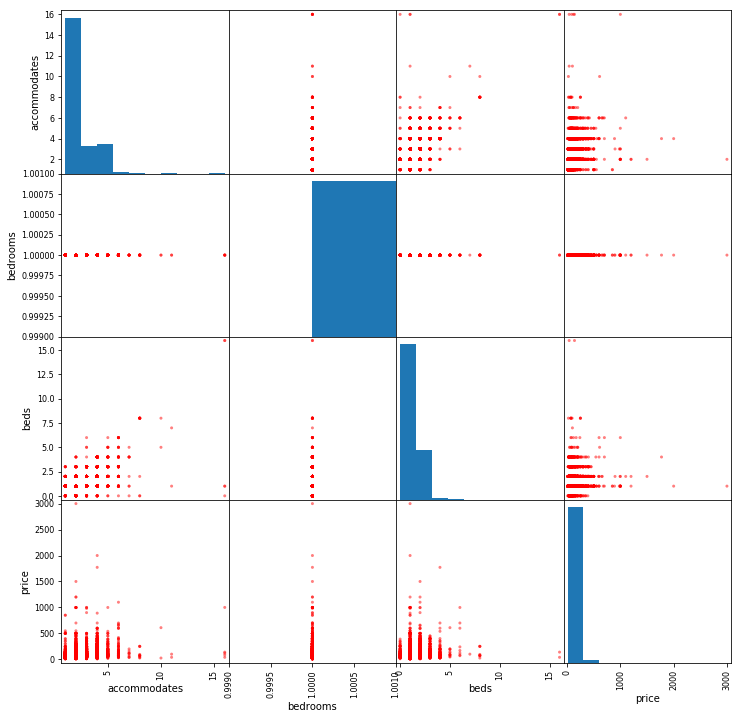

In [145]:
#Tarkastellaan scatter matrix'lla kollineaarisuutta

scattercols = ['accommodates', 'bedrooms', 'beds', 'price']
axs = pd.plotting.scatter_matrix(alldata[scattercols],
                        figsize=(12, 12), c='red')

In [146]:
#Näyttää siltä, että parhaiten korreloi beds/accommodates

Text(0, 0.5, 'Median Absolute Error')

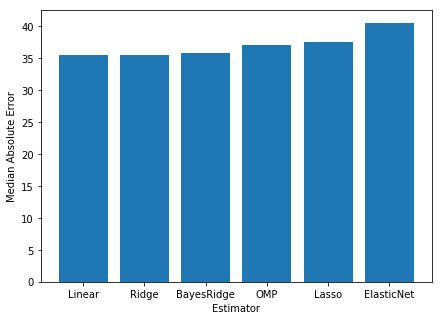

In [147]:
#Lineaarisen mallin luonti eri menetelmillä
rs = 1
ests = [ linear_model.LinearRegression(), linear_model.Ridge(),
        linear_model.Lasso(), linear_model.ElasticNet(),
        linear_model.BayesianRidge(), linear_model.OrthogonalMatchingPursuit() ]
ests_labels = np.array(['Linear', 'Ridge', 'Lasso', 'ElasticNet', 'BayesRidge', 'OMP'])
errvals = np.array([])

X_train, X_test, y_train, y_test = train_test_split(alldata.drop(['price'], axis=1),
                                                    alldata.price, test_size=0.2, random_state=20)

for e in ests:
    e.fit(X_train, y_train)
    this_err = metrics.median_absolute_error(y_test, e.predict(X_test))
    #print "got error %0.2f" % this_err
    errvals = np.append(errvals, this_err)
    
pos = np.arange(errvals.shape[0])
srt = np.argsort(errvals)
plt.figure(figsize=(7,5))
plt.bar(pos, errvals[srt], align='center')
plt.xticks(pos, ests_labels[srt])
plt.xlabel('Estimator')
plt.ylabel('Median Absolute Error')

In [148]:
#Virheet ovat noin 35-40$,pienin virhe Linear/Ridge 

In [150]:
import sklearn
print('The scikit-learn version is {}.'.format(sklearn.__version__))

sorted(sklearn.metrics.SCORERS.keys())

The scikit-learn version is 0.20.3.


['accuracy',
 'adjusted_mutual_info_score',
 'adjusted_rand_score',
 'average_precision',
 'balanced_accuracy',
 'brier_score_loss',
 'completeness_score',
 'explained_variance',
 'f1',
 'f1_macro',
 'f1_micro',
 'f1_samples',
 'f1_weighted',
 'fowlkes_mallows_score',
 'homogeneity_score',
 'mutual_info_score',
 'neg_log_loss',
 'neg_mean_absolute_error',
 'neg_mean_squared_error',
 'neg_mean_squared_log_error',
 'neg_median_absolute_error',
 'normalized_mutual_info_score',
 'precision',
 'precision_macro',
 'precision_micro',
 'precision_samples',
 'precision_weighted',
 'r2',
 'recall',
 'recall_macro',
 'recall_micro',
 'recall_samples',
 'recall_weighted',
 'roc_auc',
 'v_measure_score']

## Päivitys Anaconda ympäristössä ei onnistu
## Loppu osa tehty CSC Notebooksissa, mutta siellä ei taas onnistunut plotly piirakkakuviot eikä folium karttakuviot

Koneoppimisen loppupätkä löytyy GitHubista 
https://github.com/mvehmane/airbnb_munich/blob/master/airbnb_munich-machine-learning-CSC.ipynb


In [152]:
n_est = 300

tuned_parameters = {
    "n_estimators": [ n_est ],
    "max_depth" : [ 4 ],
    "learning_rate": [ 0.01 ],
    "min_samples_split" : [ 1 ],
    "loss" : [ 'ls', 'lad' ]
}

gbr = ensemble.GradientBoostingRegressor()
clf = GridSearchCV(gbr, cv=3, param_grid=tuned_parameters,
        scoring='median_absolute_error')
preds = clf.fit(X_train, y_train)
best = clf.best_estimator_
best

ValueError: 'median_absolute_error' is not a valid scoring value. Use sorted(sklearn.metrics.SCORERS.keys()) to get valid options.

#### Kopioimalla voi tehdä ihmeitä.

#### Vaikea ymmärtää mitä oikeasti tapahtuu tilastomatematiikan näkökulmasta.

#### Vaikea ymmärtää missä muodossa optimaalisen datasetin tulisi olla.

## joda_06_toimeenpano

Sitten kun laitan (ensin täytyy tosin hankkia) Munchenin asuntoni vuokralle Airbnb:n kautta voin tehdä analyyseja Inside Airbnb tietojen avulla. Vertailen saman tyyppisten, samalla alueella sijaitsevien asuntojen hinnoittelua ja sen perusteella asetan järkevän vuokrahinnan.<br>
Erilaisten palvelujen tarjoajille analyysi antaisi myös vinkkejä mihin asuntoihin voisi kohdistaa suoramarkkinointia. Jatkuvassa vuokrakäytössä oleviin kohteisiin voisi mainostaa esim. asuntoon toimitettavia aamiaispalveluja tai lähiseudun kahviloita ja kauppoja.<br>
Investointimielessä kovin pitkälle meneviä suosituksia ei vielä tämän perusteella voi tehdä vaan analyysiä ja koneoppimisen mallia pitäisi kehittää edelleen.
Lisäksi sijoitusmielessä tulisi analyysiin ottaa hieman eri näkökulma; käyttöaste ja asunnon hankintahinta tulisi ottaa tarkasti huomioon, joten pelkästään Inside Airbnb datalla sitä ei voisi tehdä. <br> Hinnoittelun kannalta ylivoimaisen tärkeää on majoituskapasiteetti ja se, että huoneisto on kokonaan vuokraajan käytössä. Myös sijainnilla on merkitystä aivan kuten normaalien hotellienkin osalta.
Hinnoittelumallin kannalta merkityksellisin munchenin alue on Ludwigsvorstadt-Isarvorstadt eli ns. alue 2 (Bezirk 2), joka sijaitsee historiallisessa keskustassa https://en.wikivoyage.org/wiki/Munich/Ludwigsvorstadt-Isarvorstadt


#### Tulokset toimeepanon kannalta jäi aika laihoiksi.

#### Onnistumisen iloa, että jotain sai kuitenkin aikaiseksi.

#### Jos saman työn tekisi uudestaan tulisi varmaan valittua enemmän muuttujia ja yritettyä monimutkaisempia datan pyörittelyjä.